# Рынок заведений общественного питания Москвы

**Заказчик**\
Инвесторы из фонда «Shut Up and Take My Money».


**Цель исследования**\
Заказчик решил попробовать себя в новой области и открыть заведение общественного питания в Москве.\
Но ещё не знает, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.\
Нам нужно:\
• подготовить исследование рынка Москвы;\
• найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.


**Входные данные**\
Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.\
Это файл moscow_places.csv:\
•	name — название заведения;\
•	address — адрес заведения;\
•	category — категория заведения, например «кафе», «пиццерия» или «кофейня»;\
•	hours — информация о днях и часах работы;\
•	lat — широта географической точки, в которой находится заведение;\
•	lng — долгота географической точки, в которой находится заведение;\
•	rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);\
•	price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;\
•	avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:\
o	«Средний счёт: 1000–1500 ₽»;\
o	«Цена чашки капучино: 130–220 ₽»;\
o	«Цена бокала пива: 400–600 ₽».\
и так далее;\
•	middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:\
o	Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.\
o	Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.\
o	Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.\
•	middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:\ 
o	Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.\
o	Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.\
o	Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.\
•	chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):\
o	0 — заведение не является сетевым\
o	1 — заведение является сетевым\
•	district — административный район, в котором находится заведение, например Центральный административный округ;\
•	seats — количество посадочных мест.\
Эта информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.


**Ход анализа**\
Анализ пройдёт в несколько этапов:\
• Обзор и предобработка данных;\
• Анализ данных;\
• Детализируем исследование;\
• Подготовим презентацию.

In [1]:
# импортируем библиотеки
import pandas as pd
from IPython.display import display
from datetime import datetime, timedelta
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
import warnings
import seaborn as sns
from scipy import stats as st
import math as mth
from plotly import graph_objects as go
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

## 1. Загрузим данные и подготовим их к анализу

In [2]:
# загрузим данные из CSV-файла в переменную
data = pd.read_csv('C:/Users/nata/Downloads/moscow_places.csv')

In [3]:
# выведим таблицу с помощью функции display
display(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [4]:
# выведим количество уникальных заведений по названию 
print('Количество заведений:', data.name.nunique())

Количество заведений: 5614


In [5]:
# выведим основную информацию о датафрейме с помощью метода info()
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
# проверим датасет на наличие пропусков
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [7]:
# выведим количество строк-дубликатов в данных 
print('Количество строк-дубликатов в данных =', data.duplicated().sum())

Количество строк-дубликатов в данных = 0


**Промежуточные выводы:**\
Изучив общую информацию о датасете, мы:\
• выяснили, что таблица содержит 13 столцов и 8406 срок. И эта информация собрана по 5614 заведениям питания в Москве. Большая часть стобцов содержит информацию строкового типа, малая - вещественные числа и единсвенный столбец - типа "целое число".\
• убедились, что в датасете отсутствуют строки-дубликаты;\
• увидели пропуски в столбцах 'hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats'. Пропусков в данных огромное количество. Просто удалить их не получится, будут искажения в исследовании.

Перед тем как приступить к анализу необходимо подготовить данные, а именно:\
• преобразовать тип данных у колонки 'seats' в таблице (так как количество посадочных мест - это целове число);\
• добавим отдельный столбец 'street' с названиями улиц из столбца с адресом;\
• добавим еще столбец 'is_24_7' с обозначением, что заведение работает ежедневно и круглосуточно (24/7):\
o	логическое значение True — если заведение работает ежедневно и круглосуточно;\
o	логическое значение False — в противоположном случае.

In [8]:
# приведем данные в столбце 'seats' к типу int64:
data['seats'] = data['seats'].astype('int64', errors = 'ignore')

In [9]:
# приведем весь текст некоторых столбов к нижнему регистру
for col in ['name', 'address']:
    data[col] = data[col].str.lower()
display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [10]:
# проверим на неявные дубликаты в столбцах 'name' и 'address'
data.duplicated(subset=['name', 'address']).sum()

4

In [11]:
# удалим эти четыре строки-дубликаты
data = data.drop_duplicates(subset=['name', 'address'])

 **Промежуточные выводы:**\
Мы привели текст к нижнему регистру в некоторых столбцах и проверили на наличие неявных дубликатов, а именно задвоение заведений по одним и тем же адресам. Выявили их и удалили.

In [12]:
# добавим отдельный столбец 'street' с названиями улиц из столбца с адресом
data['street'] = data['address'].str.split(', ').str[1]
# проверим, что получилось
print(data['street'].head())

0              улица дыбенко
1              улица дыбенко
2         клязьминская улица
3    улица маршала федоренко
4        правобережная улица
Name: street, dtype: object


In [13]:
# добавим столбец 'is_24_7' с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
data['is_24_7'] = data['hours'].str.contains('ежедневно, круглосуточно')
# проверим, что получилось
print(data['is_24_7'].head())

0    False
1    False
2    False
3    False
4    False
Name: is_24_7, dtype: object


**Промежуточные итоги:**\
Итак, мы провели следующую работу:\
• у части данных был некорретный тип данных и мы это исправили;\
• добавили одельные столбцы с названиями улиц из столбца с адресом и столбец 'is_24_7' с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

## 2. Анализ данных

### 2.1. Какие категории заведений представлены в данных? Исследуем  количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Ответим на вопрос о распределении заведений по категориям.

In [14]:
# выведим все уникальные значения из столбца 'category'
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [15]:
# выведим сводную табицу с количество объектов общественного питания по категориям
dt = (data.groupby('category').agg({'name': 'count'})
    .rename(columns={'name' : 'total'})
    .sort_values(by='total', ascending=False))

display(dt)

,total
category,
кафе,2376
ресторан,2042
кофейня,1413
"бар,паб",764
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


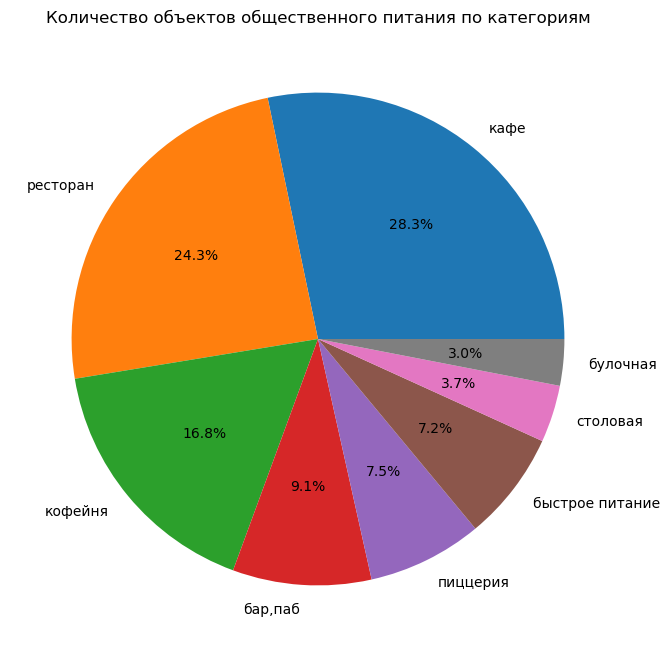

In [16]:
# построим визуализацию
plt.figure(figsize=(15,5))
dt['total'].plot(kind='pie', figsize = (12,8), autopct='%1.1f%%', y='category')
plt.title('Количество объектов общественного питания по категориям')
plt.ylabel("")
plt.show()

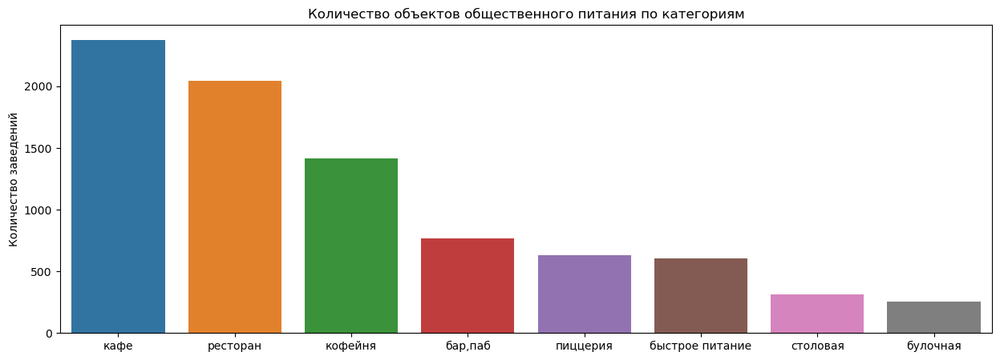

In [17]:
# построим столбчатую диаграмму с сортировкой по количеству заведений
plt.figure(figsize=(15,5))
sns.barplot(x=dt.index, y=dt['total'])
plt.title("Количество объектов общественного питания по категориям")
plt.xlabel("")
plt.ylabel("Количество заведений")
plt.show()

**Промежуточные выводы:**\
Мы исследовали количество объектов общественного питания по категориям, дополнительно построив визуализацию. И выяснили, что заведения представлены в категоиях: кафе, рестораны, кофейни, бар и пабы, пиццерии, заведения быстрого питания, столовые и булочные.\
При этом:\
• кафе и рестораны составляют более чем половину от общего числа заведений - это 52,6%;\
• кофейни, бары, пабы, пиццерия - это 33,4%;\
• быстрое питание, столовая и булочная - это 13,9%.

### 2.2. Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построем визуализации. Проанализируем результаты и сделаем выводы.

In [18]:
# проанализируем количество посадочных мест 
data['seats'].describe()

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Напомним, что в этих данных есть пропуски (их 3611 шт.) и, дополнительно изучив количество посадочных мест, мы выяснили, что количество посадочных мест очень сильно отличается для разных мест (среднее значение - 108, медианное - 75, а максимальное количество - это аж 1288 посадочных мест). Поэтому далее для исследования будем рассматривать медианное значение (так как в данных присутствуют выдающиеся значения  и среднее значение некорректно охарактеризует эти данные).

In [19]:
# выведим сводную табицу с количество объектов (медианное значение) общественного питания по категориям
dt = (data.groupby('category').agg({'seats': 'median'})
    .rename(columns={'seats': 'seats_median'})
    .sort_values(by='seats_median', ascending=False))

display(dt)

,seats_median
category,
ресторан,86.0
"бар,паб",82.0
кофейня,80.0
столовая,75.5
быстрое питание,65.0
кафе,60.0
пиццерия,55.0
булочная,50.0


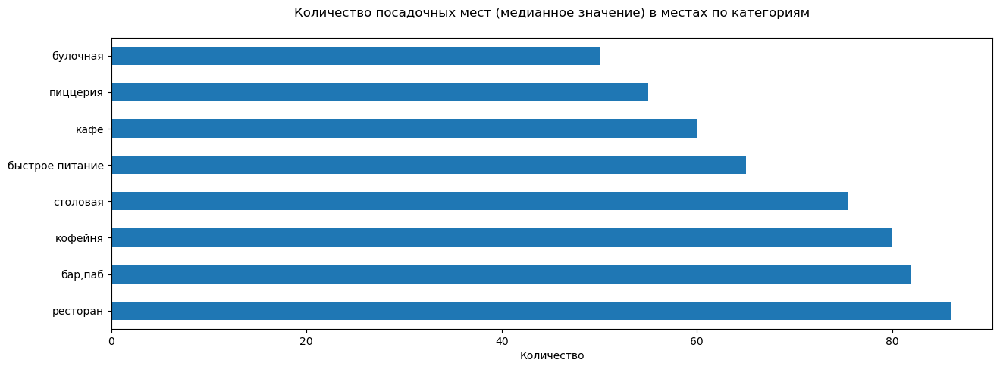

In [20]:
# построим визуализацию
plt.figure(figsize=(15,5))
dt['seats_median'].plot(kind='barh')
plt.title("Количество посадочных мест (медианное значение) в местах по категориям", fontsize=12, pad=20)
plt.xlabel("Количество")
plt.ylabel("")
plt.show()

**Промежуточные выводы:**\
Мы исследовали количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построили визуализацию.\
Мы увидели, что для всех категорий заведений медианное число посадочных мест в диапазоне от 50 до 86:\
• меньше всего посадочных мест в заведениях, которые расчитаны на быстрое обслуживание (это булочные, пиццерия, кафе и быстрое питание);\
• больше всего посадочных мест в заведениях, которые расчитаны на проведение масштабных праздников, встреч и долгое пребывание (это рестораны, бары, кофейи, столовые).

### 2.3. Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Каких заведений больше? Какие категории заведений чаще являются сетевыми? Исследуем данные и ответим на вопросы графиком.

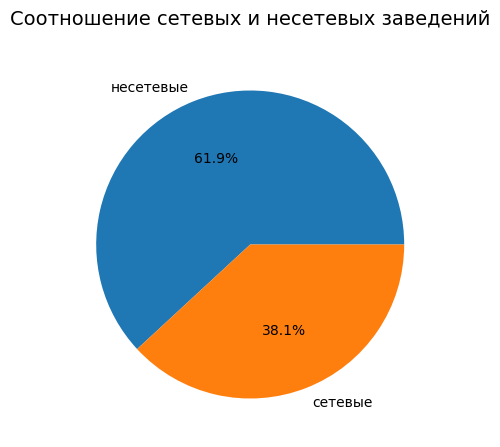

In [21]:
# соотношение сетевых и несетевых заведений
plt.figure(figsize=(15,5))
data['chain'].value_counts().plot(kind='pie', autopct='%1.1f%%', labels=['несетевые', 'сетевые'])
plt.title("Cоотношение сетевых и несетевых заведений", fontsize=14, pad=20)
plt.ylabel("")
plt.show()

In [22]:
# выведим сводную таблицу-соотношение сетевых и несетевых заведений в датасете по категориям заведений
dt = data.pivot_table(index = 'category', columns = 'chain', values = 'name', aggfunc = 'count')
dt.columns = ['non_chain', 'chain']
dt['total'] = dt['non_chain'] + dt['chain']
dt['non_chain'] = (dt['non_chain']/dt['total']).apply('{:.1%}'.format)
dt['chain'] = (dt['chain']/dt['total']).apply('{:.1%}'.format)
dt = (dt.drop(columns=('total')).sort_values(by='non_chain', ascending=False)
      .rename(columns={'non_chain': 'несетевые', 'chain': 'сетевые'}))
display(dt)

,несетевые,сетевые
category,,
"бар,паб",78.0%,22.0%
столовая,72.1%,27.9%
кафе,67.2%,32.8%
ресторан,64.3%,35.7%
быстрое питание,61.5%,38.5%
кофейня,49.0%,51.0%
пиццерия,47.9%,52.1%
булочная,38.7%,61.3%


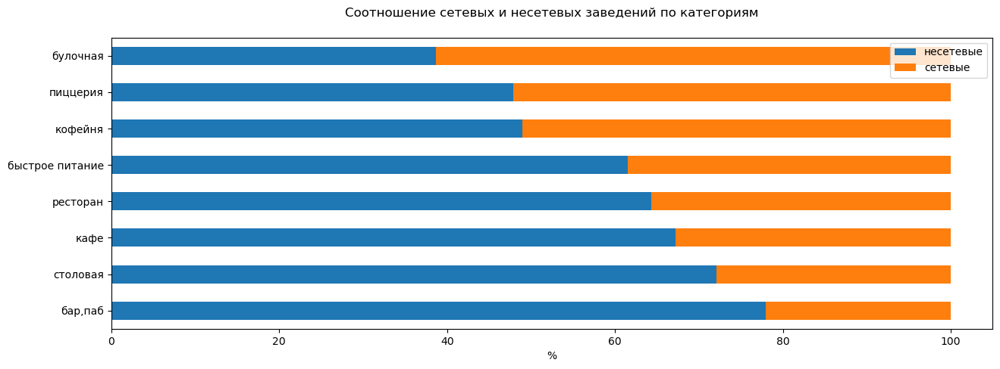

In [23]:
# Cоотношение сетевых и несетевых заведений по категориям
dt['несетевые'] = dt['несетевые'].str.strip("%").astype(float)
dt['сетевые'] = dt['сетевые'].str.strip("%").astype(float)
dt.plot(kind = 'barh', stacked = True, figsize = (15,5))
plt.title("Cоотношение сетевых и несетевых заведений по категориям", fontsize=12, pad=20)
plt.xlabel("%")
plt.ylabel("")
plt.show()

**Промежуточные выводы:**\
Мы исследовали соотношение сетевых и несетевых заведений в датасете и выяснили, что больше всего в датасете представлено несетевых заведений (это 61,9%).\
И вот какие категории заведений чаще являются сетевыми/несетевыми:\
• больше представлено несетевых заведений в категориях (пабы, столовые, кафе, рестораны и быстрое питание - это 61.5% - 77.9%;\
• больше представлено сетевых заведений в категориях (булочные, пиццерии и кофейни) -  51.0% - 61.3%. 

### 2.4. Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Под популярностью понимаем количество заведений этой сети в регионе. Построим подходящую для такой информации визуализацию. Выясним знакомы ли нам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [24]:
# сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве
# под популярностью понимаем количество заведений этой сети в регионе.
dt = (data.query('chain == 1').groupby('name').agg({'name': 'count', 'category': pd.Series.mode})
      .rename(columns={'name': 'count'})
      .sort_values(by='count', ascending=False)
      .head(15))
print('Всего заведений', dt[['count']].sum(axis=0))

display(dt)

Всего заведений count    816
dtype: int64


,count,category
name,,
шоколадница,120,кофейня
домино'с пицца,76,пиццерия
додо пицца,74,пиццерия
one price coffee,71,кофейня
яндекс лавка,69,ресторан
cofix,65,кофейня
prime,50,ресторан
хинкальная,44,кафе
кофепорт,42,кофейня


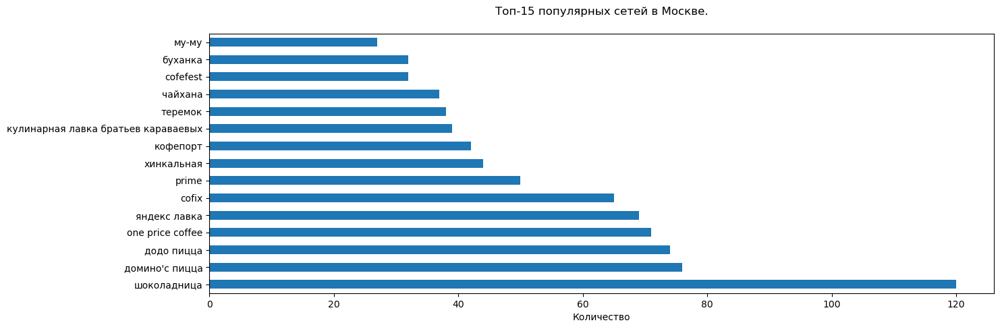

In [25]:
# построим визуализацию
plt.figure(figsize=(15,5))
dt['count'].plot(kind='barh')
plt.title("Топ-15 популярных сетей в Москве.", fontsize=12, pad=20)
plt.xlabel("Количество")
plt.ylabel("")
plt.show()

In [26]:
top15_names = dt.index.tolist()

In [27]:
print(top15_names)

['шоколадница', "домино'с пицца", 'додо пицца', 'one price coffee', 'яндекс лавка', 'cofix', 'prime', 'хинкальная', 'кофепорт', 'кулинарная лавка братьев караваевых', 'теремок', 'чайхана', 'cofefest', 'буханка', 'му-му']


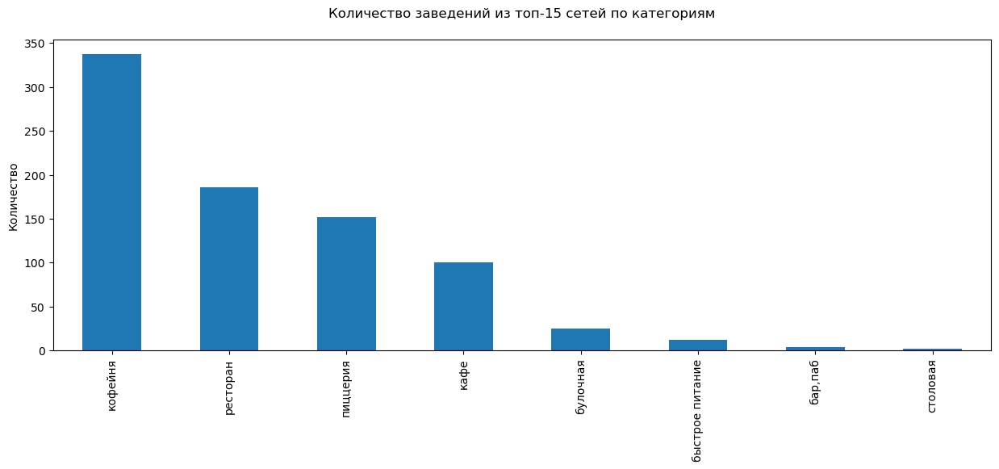

In [28]:
plt.figure(figsize=(15,5))
data.query('name in @top15_names').groupby('category')['name'].count().sort_values(ascending=False).plot(kind = 'bar')
plt.title("Количество заведений из топ-15 сетей по категориям", fontsize=12, pad=20)
plt.xlabel("")
plt.ylabel("Количество")
plt.show()

**Промежуточные выводы:**\
Мы сгруппировали данные по названиям заведений и нашли топ-15 популярных сетей в Москве (под популярностью понимаем количество заведений этой сети в регионе). Построили подходящую для такой информации визуализацию. И выяснили, что все сети нам хорошо знакомы и они расчитаны на быстрое обслуживание. Эти заведения относятся в основном к категориям кафейн, пиццерий и кафе (самое распространненое в Москве - это кофейня Шоколадница и это 120 заведений в городе).

### 2.5. Какие административные районы Москвы присутствуют в датасете? Отобразим общее количество заведений и количество заведений каждой категории по районам. Попробуем проиллюстрировать эту информацию одним графиком.

In [29]:
# выведим какие административные районы Москвы присутствуют в датасете
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [30]:
# выведим общее количество заведений и количество заведений каждой категории по районам
dt = data.pivot_table(index = 'district', columns = 'category', values = 'name', aggfunc = 'count')
dt['total'] = dt[['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']].sum(axis=1)
dt = dt.sort_values(by='total', ascending=False)
display(dt)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
district,,,,,,,,,
Центральный административный округ,364,50,87,464,428,113,670,66,2242
Северный административный округ,68,39,58,234,193,77,188,41,898
Южный административный округ,68,25,85,264,131,73,202,44,892
Северо-Восточный административный округ,62,28,82,269,159,68,182,40,890
Западный административный округ,50,37,62,238,150,71,218,24,850
Восточный административный округ,53,25,71,272,105,72,160,40,798
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409


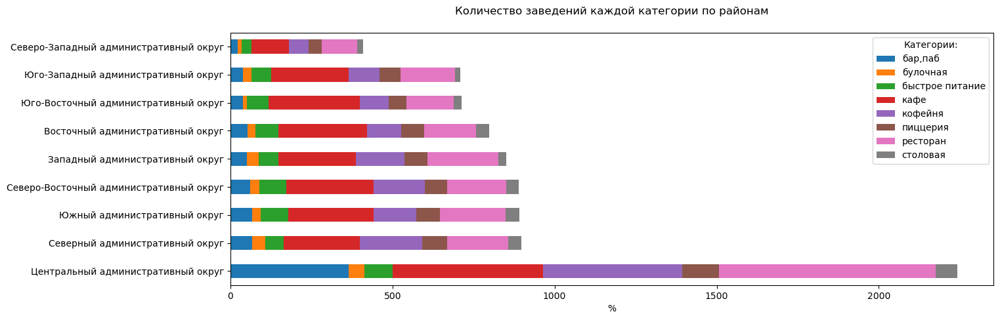

In [31]:
# проиллюстрируем общее количество заведений и количество заведений каждой категории по районам
dt.drop(columns=('total')).plot(kind = 'barh', stacked = True, figsize = (15,5))
plt.title("Количество заведений каждой категории по районам", fontsize=12, pad=20)
plt.legend(title='Категории:')
plt.xlabel("%")
plt.ylabel("")
plt.show()

**Промежуточные выводы:**\
Мы выяснили какие административные районы Москвы присутствуют в датасете:\
• Северный административный округ,\
• Северо-Восточный административный округ,\
• Северо-Западный административный округ,\
• Западный административный округ,\
• Центральный административный округ,\
• Восточный административный округ,\
• Юго-Восточный административный округ,\
• Южный административный округ,\
• Юго-Западный административный округ.\
Вывели сводную таблицу с общим количество заведений и количество заведений каждой категории по районам и проиллюстрировали эту информацию одним графиком. Из которой наглядно видно, что больше всего заведений в ЦАО (это 2242 заведения из них самые популярные это рестораны, кафе, кафейни  и бары, каждая категория представлена бое 350 заведениями), в остальных окргах Москвы менее 900 заведений на округ.

### 2.6. Визуализируем распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [32]:
# выведим сводную таблицу распределение средних рейтингов по категориям заведений
dt = (data.groupby('category').agg({'rating': 'mean'}).round(1)
      .rename(columns={'rating': 'mean_rating'})
      .sort_values(by='mean_rating', ascending=False)
      )

display(dt)

,mean_rating
category,
"бар,паб",4.4
булочная,4.3
кофейня,4.3
пиццерия,4.3
ресторан,4.3
столовая,4.2
быстрое питание,4.1
кафе,4.1


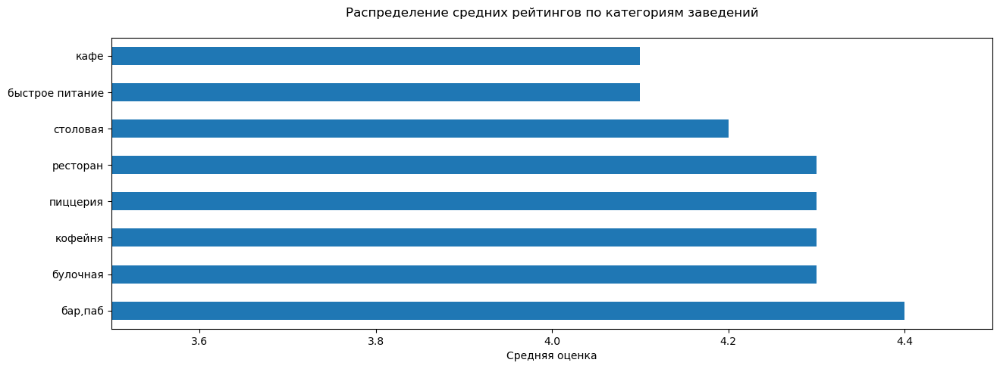

In [33]:
# построим визуализацию
plt.figure(figsize=(15,5))
dt['mean_rating'].plot(kind='barh')
plt.title("Распределение средних рейтингов по категориям заведений", fontsize=12, pad=20)

plt.xlim(3.5, 4.5) 
plt.xlabel("Средняя оценка")
plt.ylabel("")
plt.show()

**Промежуточные выводы:**\
Мы визуализировали распределение средних рейтингов по категориям заведений. И выявили, что усреднённые рейтинги в разных типах общепита не сильно ли различаются (усреднённый рейтинг от 4,1 (кафе) до 4,4 (бары и пабы)). 

### 2.7. Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

In [34]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'C:/Users/nata/Downloads/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data.groupby('district').agg({'rating': 'mean'}).reset_index(),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m


**Промежуточные выводы:**\
Мы построили фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Из визуализации видно, что заведения с самыми высокими рейтингами располагаются в ЦАО, а с самыми низкими - ЮВАО.

### 2.8. Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [35]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### 2.9. Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам. Попробуем проиллюстрировать эту информацию одним графиком.

In [36]:
# сгруппируем данные по названиям улиц и найдем топ-15 популярных улиц в Москве по количеству заведений
dt = data.pivot_table(index = 'street', columns = 'category', values = 'name', aggfunc = 'count')
dt['total'] = dt[['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']].sum(axis=1)
dt = dt.sort_values(by='total', ascending=False).head(15)
display(dt)      

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
street,,,,,,,,,
проспект мира,11.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0,183.0
профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0,122.0
проспект вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0,108.0
ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0,107.0
ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0,95.0
дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0,88.0
каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0,77.0
варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0,76.0
ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0,70.0


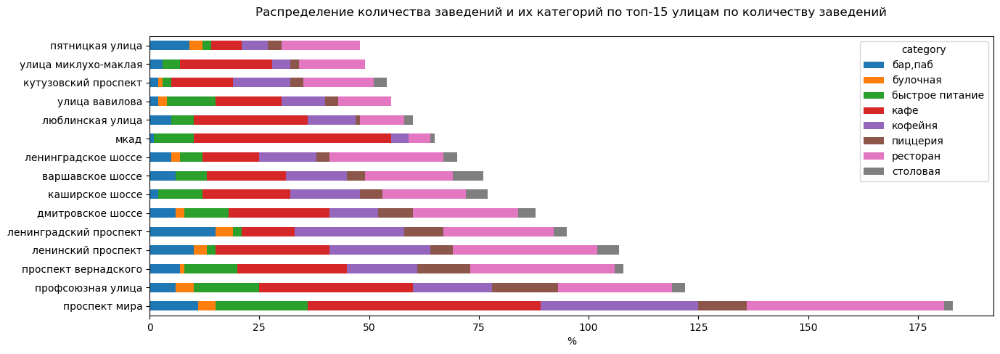

In [37]:
# распределение количества заведений и их категорий по этим улицам
dt.drop(columns=('total')).plot(kind = 'barh', stacked = True, figsize = (15,5))
plt.title("Распределение количества заведений и их категорий по топ-15 улицам по количеству заведений", fontsize=12, pad=20)
plt.xlabel("%")
plt.ylabel("")
plt.show()

**Промежуточные выводы:**\
Мы визуализировали распределения количества заведений и их категорий по топ-15 улицам по количеству заведений. И выяснили. что самая популярная улица Москвы - проспект Мира (184 заведения, на которой представлены все возможные категории заведений, и самая популярная категория - кафе (53 заведения), менее - столовая (2 заведения). 

### 2.10. Найдем улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [38]:
# найдем улицы, на которых находится только один объект общепита
dt = data.pivot_table(index = 'street', columns = 'category', values = 'name', aggfunc = 'count')
dt['total'] = dt[['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']].sum(axis=1)
dt = dt.query('total == 1')
display(dt)  

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total
street,,,,,,,,,
1-й автозаводский проезд,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0
1-й балтийский переулок,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0
1-й варшавский проезд,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0
1-й вешняковский проезд,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0
1-й голутвинский переулок,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
...,...,...,...,...,...,...,...,...,...
электрический переулок,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0
юго-западный административный округ,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0
якиманский переулок,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0


In [39]:
# найдем какие категории объекта общепита представлены на этих улицах
dt = (dt[['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']].sum(axis=0)
      .sort_values())
display(dt)

category
булочная             8.0
пиццерия            15.0
быстрое питание     23.0
столовая            36.0
бар,паб             39.0
кофейня             84.0
ресторан            93.0
кафе               159.0
dtype: float64

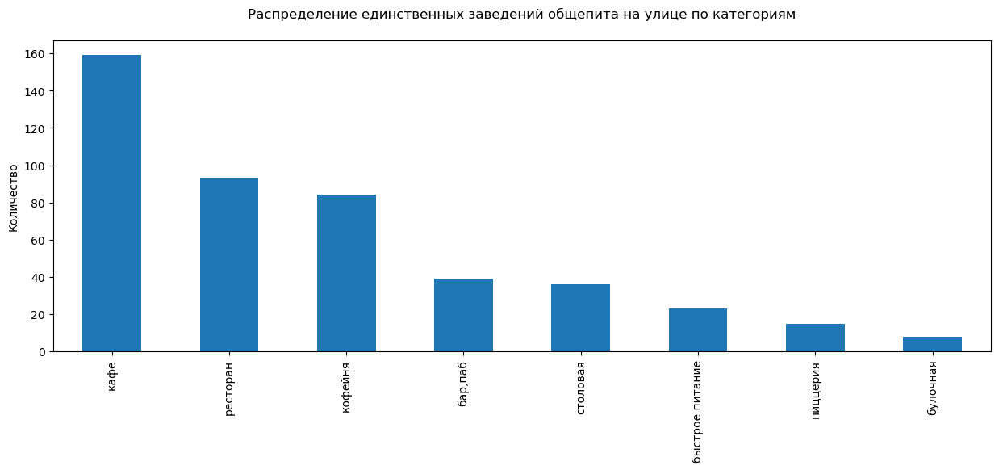

In [40]:
# построим визуализацию
plt.figure(figsize=(15,5))
dt.sort_values(ascending=False).plot(kind = 'bar')
plt.title("Распределение единственных заведений общепита на улице по категориям", fontsize=12, pad=20)
plt.xlabel("")
plt.ylabel("Количество")
plt.show()

**Промежуточные выводы:**\
Мы нашли улицы, на которых находится только один объект общепита (таких улич 458 штук). И выяснили, что в основном на этих улицах кафе, ресторан или кофеня (более 337 таких улиц).

### 2.11. Посчитаем медиану middle_avg_bill столбца для каждого района (это значения средних чеков заведений) . Используем это значение в качестве ценового индикатора района. Построем фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [41]:
# посчитаем медиану middle_avg_bill столбца для каждого района (это значения средних чеков заведений) 
dt = (data.groupby('district').agg({'middle_avg_bill': 'median'}).round()
      .rename(columns={'middle_avg_bill': 'median_middle_avg_bill'})
      .sort_values(by='median_middle_avg_bill', ascending=False)
      )

display(dt)

,median_middle_avg_bill
district,
Западный административный округ,1000.0
Центральный административный округ,1000.0
Северо-Западный административный округ,700.0
Северный административный округ,650.0
Юго-Западный административный округ,600.0
Восточный административный округ,575.0
Северо-Восточный административный округ,500.0
Южный административный округ,500.0
Юго-Восточный административный округ,450.0


In [42]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'C:/Users/nata/Downloads/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dt.reset_index(),
    columns=['district', 'median_middle_avg_bill'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Медианное значения средних чеков заведений по округам Москвы',
).add_to(m)

# выводим карту
m


**Промежуточные выводы:**\
Мы посчитали медиану middle_avg_bill столбца для каждого района (это значения средних чеков заведений). Построли фоновую картограмму (хороплет) с полученными значениями для каждого района.\
Выяснили следующее:\
• самые большие значения средних чеков заведений в центральном и западном административных округав;\
• и чем удалённее от центра цены в заведениях уменьшаются почти в 2 раза.

### 2.12.  Соберем наблюдения по вопросам выше в один общий вывод.

Мы исследовали и дополнительно строили визуализации:\
• количество объектов общественного питания по категориям и что заведения представлены в категориях;\
• количество посадочных мест в местах по категориям;\
• соотношение сетевых и несетевых заведений в датасете;\
• нашли топ-15 популярных сетей в Москве (под популярностью понимаем количество заведений этой сети в регионе);\
• выяснили какие административные районы Москвы присутствуют в датасете;\
• выявили распределение средних рейтингов по категориям заведений;\
• выявили распределения количества заведений и их категорий по топ-15 улицам по количеству заведений;\
• нашли улицы, на которых находится только один объект общепита;\
• посчитали медиану middle_avg_bill столбца для каждого района (это значения средних чеков заведений).
    
    
Наши наблюдения следующие:

• кафе, рестораны составляют более чем половину от общего числа заведений - это 52,6%; кофейни, бары, пабы, пиццерия - это 33,4%; быстрое питание, столовая и булочная - это 13,9%;

• для всех категорий заведений медианное число посадочных мест в диапазоне от 50 до 86 (меньше всего посадочных мест в заведениях, которые расчитаны на быстрое обслуживание (это булочные, пиццерия, кафе и быстрое питание), а больше всего посадочных мест в заведениях, которые расчитаны на проведение масштабных праздников, встреч и долгое пребывание (это рестораны, бары, кофейи, столовые);

• больше всего в датасете представлено несетевых заведений (это 61,9%). И эти заведения относятся к категориям пабы, столовые, кафе, рестораны и быстрое питание, а вот сетевые заведения представлены в категориях булочные, пиццерии и кофейни;

• топ-15 популярных сетей в Москве в основном представлены  заведениями категорий кафейн, пиццерий и кафе, которые расчитаны на быстрое обслуживание. Самое популярное заведение Москвы - это кофейня Шоколадница;

• больше всего заведений в ЦАО (это 2242 заведения из них самые популярные это рестораны, кафе, кафейни и бары, каждая категория представлена болле 350 заведениями), в остальных окргах Москвы менее 900 заведений только на округ;\

• усреднённые рейтинги в разных типах общепита не сильно ли различаются (усреднённый рейтинг от 4,1 (кафе) до 4,4 (бары и пабы));

• выявили самую популярную улицу Москвы - это проспект Мира (184 заведения, на которой представлены все возможные категории заведений, и самая популярная категория - кафе (53 заведения), менее - столовая (2 заведения);

• выявили улицы, на которых только один объект общепита (таких улич 458 штук). И в основном на этих улицах кафе, ресторан или кофеня (более 337 таких улиц);

• самые дорогие заведени Моквы располагаются в центральном и западном административных округах. И и чем удалённее от центра Москвы, тем  цены в заведениях уменьшаются почти в 2 раза.

### 3.  Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.
Ответим на следующие вопросы.

### 3.1. Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [43]:
# выясним сколько кофейн в датасете
dt_coffee_house = data.query('category == "кофейня"')
print('Количество кофеин:', len(dt_coffee_house))

Количество кофеин: 1413


In [44]:
(display(dt_coffee_house.groupby('district').agg({'name': 'count'})
         .rename(columns={'name': 'count'})
         .sort_values (by = 'count', ascending = False)))

,count
district,
Центральный административный округ,428
Северный административный округ,193
Северо-Восточный административный округ,159
Западный административный округ,150
Южный административный округ,131
Восточный административный округ,105
Юго-Западный административный округ,96
Юго-Восточный административный округ,89
Северо-Западный административный округ,62


In [45]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
dt_coffee_house.apply(create_clusters, axis=1)

# выводим карту
m

**Промежуточные выводы:**\
Мы выяснили, что в датасете всего 1413 кофеен. Больше всего их в ЦАО, а меньше всего в Северо-Западном административном округе.

### 3.2. Есть ли круглосуточные кофейни?

In [46]:
# выясним сколько круглосуточных кофейн в датасете
print('Количество круглосуточных кофейн:', len(dt_coffee_house.query('is_24_7 == True')))


Количество круглосуточных кофейн: 59


In [47]:
(display(dt_coffee_house.query('is_24_7 == True').groupby('district').agg({'name': 'count'})
         .rename(columns={'name': 'count'})
         .sort_values (by = 'count', ascending = False)))

,count
district,
Центральный административный округ,26
Западный административный округ,9
Юго-Западный административный округ,7
Восточный административный округ,5
Северный административный округ,5
Северо-Восточный административный округ,3
Северо-Западный административный округ,2
Юго-Восточный административный округ,1
Южный административный округ,1


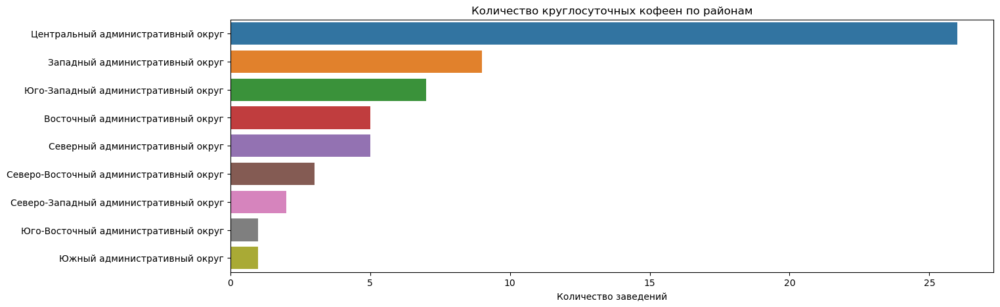

In [48]:
# построим столбчатую диаграмму 
plt.figure(figsize=(15,5))

dt_new = (dt_coffee_house.query('is_24_7 == True').groupby('district').agg({'name': 'count'})
         .rename(columns={'name': 'count'})
         .sort_values (by = 'count', ascending = False))

sns.barplot(x=dt_new['count'], y=dt_new.index)
plt.title("Количество круглосуточных кофеен по районам")
plt.xlabel("Количество заведений")
plt.ylabel("")
plt.show()

**Промежуточные выводы:**\
Мы выяснили, что в датасете всего 59 круглосуточных кофейн из 1413 представленных в датасете. И в ЦАО, ЗАО представлено их большенство - 35 шт.

### 3.3. Какие у кофеен рейтинги? Как они распределяются по районам?

In [49]:
# выведим сводную таблицу распределение средних рейтингов по категориям заведений
dt_rating = (dt_coffee_house.groupby('district').agg({'rating': 'mean'}).round(2)
      .rename(columns={'rating': 'mean_rating'})
      .sort_values(by='mean_rating', ascending=False)
      )

display(dt_rating)

,mean_rating
district,
Центральный административный округ,4.34
Северо-Западный административный округ,4.33
Северный административный округ,4.29
Восточный административный округ,4.28
Юго-Западный административный округ,4.28
Юго-Восточный административный округ,4.23
Южный административный округ,4.23
Северо-Восточный административный округ,4.22
Западный административный округ,4.20


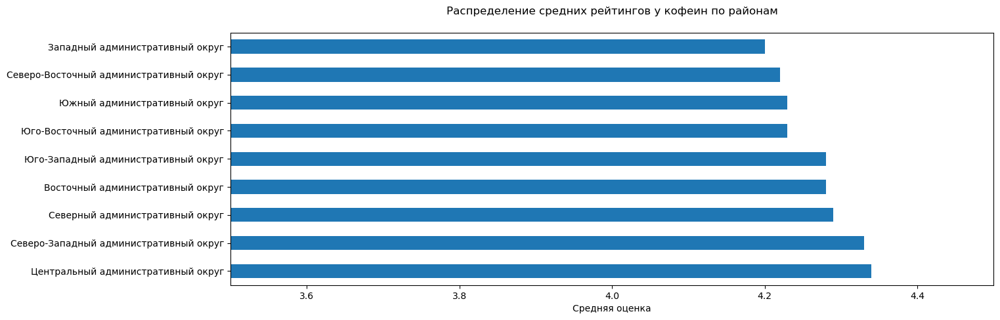

In [50]:
# построим визуализацию
plt.figure(figsize=(15,5))
dt_rating['mean_rating'].plot(kind='barh')
plt.title("Распределение средних рейтингов у кофеин по районам", fontsize=12, pad=20)

plt.xlim(3.5, 4.5) 
plt.xlabel("Средняя оценка")
plt.ylabel("")
plt.show()

**Промежуточные выводы:**\
Мы выяснили, что рейтинги у кофейн не сильно отличаются друг о друга относительно районов расположения (оценка от 4,34  до 4,20 и это, соответсвеено, Центральный и Западный административныйе округа).

### 3.4. На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [51]:
# проанализируем количество посадочных мест 
dt_coffee_house['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Напомним, что в этих данных есть пропуски и, дополнительно изучив столбец с ценой одной чашки капучино, мы выяснили, что цена очень сильно отличается для разных мест (минимальная - 60, а максимальная  - 1568). Поэтому далее для исследования будем рассматривать медианное значение (так как в данных присутствуют выдающиеся значения  и среднее значение некорректно охарактеризует эти данные).

In [52]:
# выведим сводную табицу медианное значение стоимости чашки капучино по округам
dt_middle_coffee_cup = (dt_coffee_house.groupby('district').agg({'middle_coffee_cup': 'median'}).round(2)
      .rename(columns={'middle_coffee_cup': 'median_middle_coffee_cup'})
      .sort_values(by='median_middle_coffee_cup', ascending=False)
      )

display(dt_middle_coffee_cup)


,median_middle_coffee_cup
district,
Юго-Западный административный округ,198.0
Центральный административный округ,190.0
Западный административный округ,189.0
Северо-Западный административный округ,165.0
Северо-Восточный административный округ,162.5
Северный административный округ,159.0
Южный административный округ,150.0
Юго-Восточный административный округ,147.5
Восточный административный округ,135.0


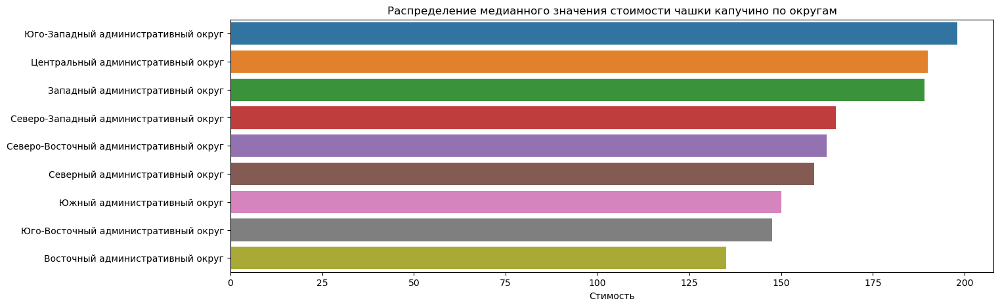

In [53]:
# построим столбчатую диаграмму 
plt.figure(figsize=(15,5))
sns.barplot(x=dt_middle_coffee_cup['median_middle_coffee_cup'], y=dt_middle_coffee_cup.index)
plt.title("Распределение медианного значения стоимости чашки капучино по округам")
plt.xlabel("Стимость")
plt.ylabel("")
plt.show()

**Промежуточные выводы:**\
Мы выяснили на какую стоимость чашки капучино стоит ориентироваться при открытии кафейни в:\
• самых дорогих округах Москвы - ЮЗАО, ЦАО и ЗАО - это цены от 189 у.е.;\
• самых бюджетных округах Мск - ВАО, ЮВАО и ЮАО - это цены до 150 у.е.

### 3.5. Попробуем дать рекомендацию для открытия нового заведения. 

Мы детализировали исследование: открытие кофейни и выяснили следующую информацию:\
• в представленном датасете всего 1413 кофеен. По территориальному расположению больше всего их в ЦАО (428 кофеен), далее ЗАО (150 кофеен), а меньше всего в Северо-Западном административном округе (62 кофени);

• из  1413 кофеен только 59 круглосуточных (почти все они представлены в ЦАО - 26 шт., ЗАО - это 9 шт.);

• рейтинги у кофейн не сильно отличаются друг о друга относительно районов расположения (оценки от 4,2 - ЗАО до 4,34 - ЦАО);

• на стоимость чашки капучино сильно влияет территориальное расположение кафейни так в самых дорогих округах Москвы - ЮЗАО, ЦАО и ЗАО - это цены от 189 у.е., а вот в бюджетных округах Мск - ВАО, ЮВАО и ЮАО - это цены до 150 у.е.


Рекомендации:\
Мы рекомендуем открыть новое заведение в ЗАО по нескольким причинам:
• этот округ после ЦАО наиболее респектабельный и статусный округ Москвы. Благодаря удачному расположению в округе преобладает множество парковых зон и развитая инфраструктура;\

• в этом районе большая часть жилого фонда ЗАО приходится на новостройки и «сталинки»,  где кофеен всего 150 шт.;

• расмотреть варинат открытия круглосуточного заведения (в этом районе таковых всего 9 шт.);

• обратить внимание на рейтинг кафейни (так как сейчас видно, что рейтинг не самый высокий у текущих и есть куда расти);\

• проработать систему лояльности для клиентов кафейни (минимизировать цены на стоимость чашки капучино - до 150 у.е.).